# Pour commencer

Nous devons d'abord charger (et possiblement installer) les librairies nécessaires.  

Voici une description de certaines des librairies utilisées.

- `os` permet d'utiliser des fonctions liées aux fichiers sur disque et au système d'exploitation.
- `re` pour utiliser des expressions régulières
- `matplotlib` et `seaborn` pour générer des graphiques
- `numpy` pour des opérations d'algèbres linéaires et mathématiques
- `pandas` pour faciliter la manipulation et la structure des données (parfois lent pour les gros jeux de données)

In [1]:
# Installation et chargement des librairies requise
import re
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

#!pip install ydata_profiling ipywidgets
#!pip install --upgrade Pillow
#!pip install openpyxl

from ydata_profiling import ProfileReport
colors = ["#40BEAD", "#248CC4", "#308E81", "#576AC9"]  # palette de couleurs IVADO
sns.set_style("whitegrid")

Nous allons regarder deux jeux de données : 

- Le portrait dans les urgences des établissements de santé au Québec
- Le rendement d'avoine dans les champs en Ontario

# Le portrait dans les urgences des établissements de santé au Québec

Le fichier de la situation horaire des urgences dans les établissements de santé est disponibles en version ouverte. Il ne contient pas d'informations sur les patients. Il contient plutôt des données agrégés. 

Chaque établissement de santé fournit des données sur la situation à l'urgence, notamment le nombre de civières fonctionnelles, le nombre de civières occupées, les durées de séjour sur civière et en ambulatoire, le temps d'attente avant la prise en charge, le nombre patients présents, le nombre de patients présents depuis plus de 24h et 48h. 

La source de données est la Console provinciale des urgences (CPU).



Informations sur le jeu de données : 

* Les données sont mises à jour à toutes les heures (toutes les données ne sont pas horaires).
* Les données sont accessibles sous la forme d'un fichier .csv
* Les différents champs contiennent des dates, du texte et des valeurs numériques
* Il n'y a pas de donnée sensible ou confidentielle dans le fichier
* Il y a des données manquantes

Comme première étape, il faut s'assurer de comprendre le domaine et les variables.

In [3]:
url = 'https://www.msss.gouv.qc.ca/professionnels/statistiques/documents/urgences/Releve_horaire_urgences_7jours_nbpers.csv'
df = pd.read_csv(url, sep=',', encoding='latin')
df.head()

,RSS,Region,Nom_etablissement,Nom_installation,No_permis_installation,Nombre_de_civieres_fonctionnelles \t\t\t\t\t\t,Nombre_de_civieres_occupees,Nombre_de_patients_sur_civiere_plus_de_24_heures,Nombre_de_patients_sur_civiere_plus_de_48_heures\t\t\t\t\t\t,Nombre_total_de_patients_presents_a_lurgence,Nombre_total_de_patients_en_attente_de_PEC,DMS_sur_civiere,DMS_ambulatoire\t\t\t\t\t\t,DMS_sur_civiere_horaire,DMS_ambulatoire_horaire,Heure_de_l'extraction_(image),Mise_a_jour
0,1,Bas-Saint-Laurent,Total régional,Total régional,,52,36,5,2,105,39,9.664565,3.29112,9:39,3:17,16:00:00,2025-03-02T16:45
1,1,Bas-Saint-Laurent,CISSS DU BAS-SAINT-LAURENT,CENTRE HOSPITALIER RÉGIONAL DU GRAND-PORTAGE,51218352,9,2,0,0,12,7,7.660000,3.01000,7:39,3:00,16:00:00,2025-03-02T16:45
2,1,Bas-Saint-Laurent,CISSS DU BAS-SAINT-LAURENT,HÔPITAL DE MATANE,51218980,7,6,0,0,10,4,5.330000,2.91000,5:19,2:54,16:00:00,2025-03-02T16:45
3,1,Bas-Saint-Laurent,CISSS DU BAS-SAINT-LAURENT,CLSC DE POHÉNÉGAMOOK,51219418,3,0,0,0,1,0,3.180000,1.08000,3:10,1:04,16:00:00,2025-03-02T16:45
4,1,Bas-Saint-Laurent,CISSS DU BAS-SAINT-LAURENT,HÔPITAL NOTRE-DAME-DE-FATIMA,51221141,7,6,1,0,19,10,11.680000,3.62000,11:40,3:37,16:00:00,2025-03-02T16:45


In [5]:
# Sauvegarder le fichier localement en .csv
# Il est en mémoire, mais cela nous permet de l'ouvrir pour le regarder.
df.to_csv('portrait_horaire_urgence.csv')

In [4]:
df.tail(3)

,RSS,Region,Nom_etablissement,Nom_installation,No_permis_installation,Nombre_de_civieres_fonctionnelles \t\t\t\t\t\t,Nombre_de_civieres_occupees,Nombre_de_patients_sur_civiere_plus_de_24_heures,Nombre_de_patients_sur_civiere_plus_de_48_heures\t\t\t\t\t\t,Nombre_total_de_patients_presents_a_lurgence,Nombre_total_de_patients_en_attente_de_PEC,DMS_sur_civiere,DMS_ambulatoire\t\t\t\t\t\t,DMS_sur_civiere_horaire,DMS_ambulatoire_horaire,Heure_de_l'extraction_(image),Mise_a_jour
128,16,Montérégie,CISSS DE LA MONTÉRÉGIE-EST,HÔPITAL HONORÉ-MERCIER,51229193,26,25,5,0,50,29,15.250000,7.190000,15:15,7:11,19:00:00,2024-10-14T19:45
129,16,Montérégie,CISSS DE LA MONTÉRÉGIE-CENTRE,HÔPITAL CHARLES-LE MOYNE,51233799,43,39,3,1,91,43,16.970000,7.310000,16:58,7:18,19:00:00,2024-10-14T19:45
130,99,Ensemble du Québec,Ensemble du Québec,Ensemble du Québec,,1981,2102,626,263,4311,1668,15.688794,5.001789,15:41,5:00,19:00:00,2024-10-14T19:45


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131 entries, 0 to 130
Data columns (total 17 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   RSS                                                     131 non-null    int64  
 1   Region                                                  131 non-null    object 
 2   Nom_etablissement                                       131 non-null    object 
 3   Nom_installation                                        131 non-null    object 
 4   No_permis_installation                                  131 non-null    object 
 5   Nombre_de_civieres_fonctionnelles 						                131 non-null    int64  
 6   Nombre_de_civieres_occupees                             131 non-null    int64  
 7   Nombre_de_patients_sur_civiere_plus_de_24_heures        131 non-null    int64  
 8   Nombre_de_patients_sur_civiere_plus_de_4

Retour sur les fonctions <code>pandas</code> vues la semaine dernière. Compléter les ... pour explorer le jeu de données

In [ ]:
# Afficher les noms des colonnes
...

In [ ]:
# Afficher des informations de base sur le jeu de données
...

In [ ]:
# Combien y a-t-il de civières occupées dans la région d'Outaouais ?
...
# Réponse : ____________



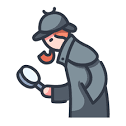

Quelles sont vos réponses ?


In [9]:
df.loc[df.Region=='Outaouais', 'Nombre_de_civieres_occupees'].sum()

194

Il est très important d'explorer les données et de les comprendre.  C'est la première étape pour pouvoir les nettoyer.  

Le nettoyage de données est un processus itératif.  On ne trouve pas toutes les erreurs du premier coup.  Plus on explore, plus on relève de cas particuliers que l'on peut traiter.


Quelles sont les étapes de nettoyage ? <br>
    
    
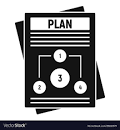

<br>
<ul>
    <li> Vérifier s'il y a des valeurs négatives. Si oui, les expliquer et les retirer</li>
    <li> Retirer les valeurs agrégées pour les régions (les totaux de régions) </li>
    <li> Retirer les établissements pour lesquels les valeurs sont manquantes</li>
    <li> Standardiser le type des variables dans les colonnes (on ne mélange pas du texte et des nombres)</li>
    <li> Retirer les caractères spéciaux dans les noms de colonnes</li>
</ul>


Retirer les établissements pour lesquels les valeurs sont manquantes


In [11]:
df.convert_dtypes().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131 entries, 0 to 130
Data columns (total 17 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   RSS                                                     131 non-null    Int64  
 1   Region                                                  131 non-null    string 
 2   Nom_etablissement                                       131 non-null    string 
 3   Nom_installation                                        131 non-null    string 
 4   No_permis_installation                                  131 non-null    string 
 5   Nombre_de_civieres_fonctionnelles 						                131 non-null    Int64  
 6   Nombre_de_civieres_occupees                             131 non-null    Int64  
 7   Nombre_de_patients_sur_civiere_plus_de_24_heures        131 non-null    Int64  
 8   Nombre_de_patients_sur_civiere_plus_de_4

In [13]:
print("Nombre de civières occupées :", df.Nombre_de_civieres_occupees.sum())

Nombre de civières occupées : 6465


Vérifier s'il y a des valeurs négatives. Si oui, les expliquer et les retirer

In [15]:
df_neg = df.loc[df['Nombre_de_civieres_occupees']<0,: ] # ou df.loc[df['Nombre_de_civieres_occupees']<0]
print("Nombre de valeurs négatives pour le nombre de civières occupées :", df_neg.shape[0])

Nombre de valeurs négatives pour le nombre de civières occupées : 0


Retirer les caractères spéciaux dans les noms de colonnes

In [17]:
df.columns.tolist()

['RSS',
 'Region',
 'Nom_etablissement',
 'Nom_installation',
 'No_permis_installation',
 'Nombre_de_civieres_fonctionnelles \t\t\t\t\t\t',
 'Nombre_de_civieres_occupees',
 'Nombre_de_patients_sur_civiere_plus_de_24_heures',
 'Nombre_de_patients_sur_civiere_plus_de_48_heures\t\t\t\t\t\t',
 'Nombre_total_de_patients_presents_a_lurgence',
 'Nombre_total_de_patients_en_attente_de_PEC',
 'DMS_sur_civiere',
 'DMS_ambulatoire\t\t\t\t\t\t',
 'DMS_sur_civiere_horaire',
 'DMS_ambulatoire_horaire',
 "Heure_de_l'extraction_(image)",
 ' Mise_a_jour']

In [ ]:
# Retirer les caractères spéciaux dans le nom des colonnes
# Afficher les 3 premières lignes pour vérifier votre modification
...

In [19]:
# Retirer les caractères spéciaux dans le nom des colonnes
# Afficher les 3 premières et 3 dernières lignes pour vérifier votre modification
df.columns = [x.strip() for x in df.columns]

Retirer les valeurs agrégées pour les régions (les totaux de régions)
Comment vous y prendrez-vous ?

In [ ]:
# Retirer les valeurs agrégées pour les régions (les totaux de régions)
# Afficher les 3 premières et 3 dernières lignes pour vérifier votre modification
...

In [21]:
print("Dimension du dataframe : ", df.shape)

Dimension du dataframe :  (131, 17)


In [23]:
df = df.loc[pd.notnull(df.No_permis_installation),:]

print("Dimension du dataframe : ", df.shape)

Dimension du dataframe :  (131, 17)


Est-ce que la modification a fonctionné ?

In [25]:
print(list(df.No_permis_installation)[0:10])

[' ', '51218352', '51218980', '51219418', '51221141', '51221877', '51226892', '51227882', '51236156', ' ']


Quelles conditions nous permettent de filtrer les rangées sans No de permis d'installation ? <br>
Nous cherchons à obtenir un vecteur de valeurs booléennes (True/False) 

In [27]:
# Option qui ne fonctione pas
pd.notnull(df.No_permis_installation)

0      True
1      True
2      True
3      True
4      True
       ... 
126    True
127    True
128    True
129    True
130    True
Name: No_permis_installation, Length: 131, dtype: bool

In [29]:
# Option 1

# Nous savons (après observation) que les valeurs manquantes sont indiquées par un espace
no_permis_valide1 = list(df.No_permis_installation!=" ")
print(no_permis_valide1[0:10], f"Nb permis valide: {sum(no_permis_valide1)}")

[False, True, True, True, True, True, True, True, True, False] Nb permis valide: 115


In [31]:
# Option 2: Nous savons que les no de permis sont des chiffres

no_permis_valide2 = [x.isdigit() for x in df.No_permis_installation]
print(no_permis_valide2[0:10], f"Nb permis valide: {sum(no_permis_valide2)}")

[False, True, True, True, True, True, True, True, True, False] Nb permis valide: 115


In [33]:
df = df.loc[df.No_permis_installation!=" ",:]
print("Dimension du dataframe : ", df.shape)

# ou  df = df.loc[no_permis_valide1,:]
# ou  df = df.loc[no_permis_valide2,:]

Dimension du dataframe :  (115, 17)


In [41]:
# Les fonctions cut et pivot_table peuvent nous aider à explorer les données
df['Groupe'] = pd.cut(df['Nombre_de_civieres_occupees'], bins=5)
df.pivot_table(index='Groupe', columns=['Region'], values='Nombre_de_civieres_occupees', observed=False)

Region,Abitibi-Témiscamingue,Bas-Saint-Laurent,Capitale-Nationale,Chaudière-Appalaches,Côte-Nord,Estrie,Gaspésie-Îles-de-la-Madeleine,Lanaudière,Laurentides,Laval,Mauricie et Centre-du-Québec,Montréal,Montérégie,Outaouais,Saguenay-Lac-Saint-Jean
Groupe,,,,,,,,,,,,,,,
"(-0.101, 20.2]",7.166667,4.5,6.25,7.333333,5.125,9.5,4.375,NaN,10.0,NaN,4.8,11.222222,12.500000,3.166667,8.2
"(20.2, 40.4]",NaN,NaN,27.50,22.000000,NaN,28.0,NaN,36.0,NaN,NaN,30.5,27.250000,29.500000,37.000000,26.0
"(40.4, 60.6]",NaN,NaN,44.50,55.000000,NaN,42.0,NaN,43.0,50.0,NaN,51.0,48.200000,47.333333,41.000000,NaN
"(60.6, 80.8]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,75.0,67.0,NaN,63.500000,64.000000,NaN,NaN
"(80.8, 101.0]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.000000,NaN,NaN,NaN




D'après vous, que fait la fonction cut ?

Est-ce que ce tableau est utile ?
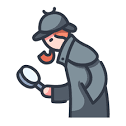

In [43]:
df['Groupe'] = pd.cut(df['Nombre_de_civieres_occupees'], bins=[0,10,20,30,40,60,100])
df.pivot_table(index='Groupe', columns=['Region'], values='Nombre_de_civieres_occupees', observed=False,
               aggfunc=pd.Series.nunique).T

Groupe,"(0, 10]","(10, 20]","(20, 30]","(30, 40]","(40, 60]","(60, 100]"
Region,,,,,,
Abitibi-Témiscamingue,2.0,1.0,NaN,NaN,NaN,NaN
Bas-Saint-Laurent,3.0,1.0,NaN,NaN,NaN,NaN
Capitale-Nationale,4.0,2.0,1.0,1.0,2.0,NaN
Chaudière-Appalaches,2.0,1.0,1.0,NaN,1.0,NaN
Côte-Nord,3.0,2.0,NaN,NaN,NaN,NaN
Estrie,2.0,2.0,1.0,NaN,1.0,NaN
Gaspésie-Îles-de-la-Madeleine,3.0,NaN,NaN,NaN,NaN,NaN
Lanaudière,NaN,NaN,NaN,1.0,1.0,NaN
Laurentides,2.0,2.0,NaN,NaN,1.0,1.0


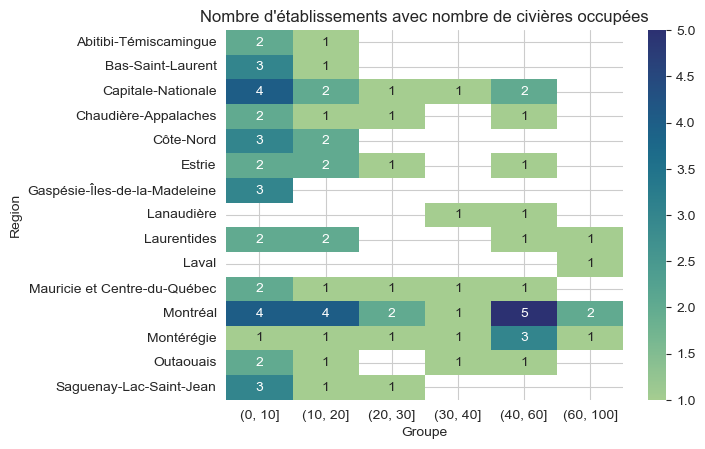

In [55]:
df['Groupe'] = pd.cut(df['Nombre_de_civieres_occupees'], bins=[0,10,20,30,40,60,100])
mx = df.pivot_table(index='Groupe', columns=['Region'], values='Nombre_de_civieres_occupees', observed=False,
               aggfunc=pd.Series.nunique).T
sns.heatmap(mx,  cmap="crest", annot=True).set_title("Nombre d'établissements avec nombre de civières occupées")
plt.show()


Est-ce que ce graphique est utile ?
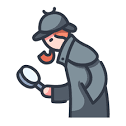

In [60]:
df.sort_values(['Nombre_de_civieres_occupees'], ascending=False).head(3)

,RSS,Region,Nom_etablissement,Nom_installation,No_permis_installation,Nombre_de_civieres_fonctionnelles,Nombre_de_civieres_occupees,Nombre_de_patients_sur_civiere_plus_de_24_heures,Nombre_de_patients_sur_civiere_plus_de_48_heures,Nombre_total_de_patients_presents_a_lurgence,Nombre_total_de_patients_en_attente_de_PEC,DMS_sur_civiere,DMS_ambulatoire,DMS_sur_civiere_horaire,DMS_ambulatoire_horaire,Heure_de_l'extraction_(image),Mise_a_jour,Groupe
67,6,Montréal,CIUSSS DU CENTRE-OUEST-DE-L'ÎLE-DE-MONTRÉAL,HÔPITAL GÉNÉRAL JUIF,51248250,53,101,42,20,124,34,16.08,5.10,16:04,5:06,16:00:00,2025-03-02T16:45,NaN
118,15,Laurentides,CISSS DES LAURENTIDES,HÔPITAL DE SAINT-JÉRÔME,51228880,47,75,36,17,130,55,19.55,4.80,19:33,4:48,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"
110,13,Laval,CISSS DE LAVAL,HÔPITAL DE LA CITÉ-DE-LA-SANTÉ,51228757,49,67,26,4,113,42,19.86,9.23,19:51,9:13,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"


In [62]:
df.loc[df.Nombre_de_civieres_occupees>60,:]

,RSS,Region,Nom_etablissement,Nom_installation,No_permis_installation,Nombre_de_civieres_fonctionnelles,Nombre_de_civieres_occupees,Nombre_de_patients_sur_civiere_plus_de_24_heures,Nombre_de_patients_sur_civiere_plus_de_48_heures,Nombre_total_de_patients_presents_a_lurgence,Nombre_total_de_patients_en_attente_de_PEC,DMS_sur_civiere,DMS_ambulatoire,DMS_sur_civiere_horaire,DMS_ambulatoire_horaire,Heure_de_l'extraction_(image),Mise_a_jour,Groupe
48,6,Montréal,CIUSSS DU NORD-DE-L'ÎLE-DE-MONTRÉAL,HÔPITAL DU SACRÉ-COEUR-DE-MONTRÉAL,12475976,46,64,40,13,100,22,25.59,8.82,25:35,8:49,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"
62,6,Montréal,CENTRE HOSPITALIER DE L'UNIVERSITÉ DE MONTRÉAL,CENTRE HOSPITALIER DE L'UNIVERSITÉ DE MONTRÉAL,51236297,51,63,20,2,102,30,21.01,7.32,21:00,7:19,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"
67,6,Montréal,CIUSSS DU CENTRE-OUEST-DE-L'ÎLE-DE-MONTRÉAL,HÔPITAL GÉNÉRAL JUIF,51248250,53,101,42,20,124,34,16.08,5.10,16:04,5:06,16:00:00,2025-03-02T16:45,NaN
110,13,Laval,CISSS DE LAVAL,HÔPITAL DE LA CITÉ-DE-LA-SANTÉ,51228757,49,67,26,4,113,42,19.86,9.23,19:51,9:13,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"
118,15,Laurentides,CISSS DES LAURENTIDES,HÔPITAL DE SAINT-JÉRÔME,51228880,47,75,36,17,130,55,19.55,4.80,19:33,4:48,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"
123,16,Montérégie,CISSS DE LA MONTÉRÉGIE-EST,HÔPITAL PIERRE-BOUCHER,51229011,47,64,28,11,103,43,18.30,6.99,18:18,6:59,16:00:00,2025-03-02T16:45,"(60.0, 100.0]"


Les graphiques sont aussi un bon moyen d'explorer les données

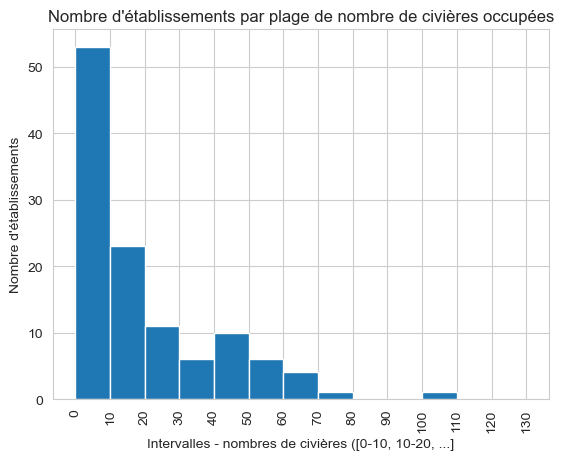

In [68]:
df["Nombre_de_civieres_occupees"].hist(bins=range(0,140,10),label="Nombre de civieres occupees")
plt.title("Nombre d'établissements par plage de nombre de civières occupées")
plt.xlabel("Intervalles - nombres de civières ([0-10, 10-20, ...]")
plt.ylabel("Nombre d'établissements")
plt.xticks(range(0,140,10), rotation=90)
plt.show()

# Qu'est-ce que nous pourrions améliorer dans le code ci-haut ?
# Indice : des valeurs se répètent et sont codées explicitement

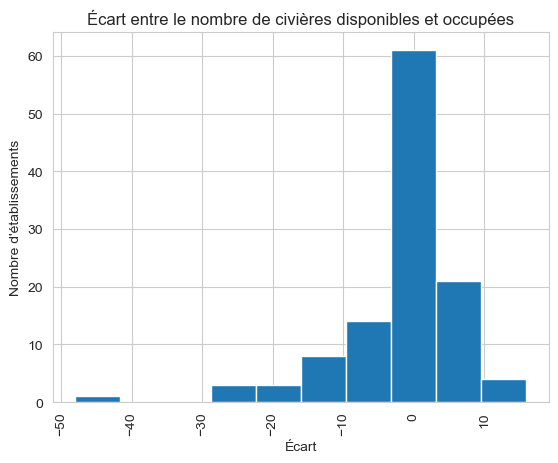

In [72]:
# Est-ce que ce graphique est utile ?
ecart = (df.Nombre_de_civieres_fonctionnelles - df.Nombre_de_civieres_occupees)
ecart.hist(bins=10,label="Nombre de civieres occupees")
plt.title("Écart entre le nombre de civières disponibles et occupées")
plt.xlabel("Écart")
plt.ylabel("Nombre d'établissements")
plt.xticks(rotation=90)
plt.show()

In [74]:
df.loc[:,'écart'] = ecart
df.loc[:, ['Region', 'Nom_etablissement', 'Nom_installation', 'Nombre_de_civieres_fonctionnelles',
       'Nombre_de_civieres_occupees', 'écart']].sort_values('écart', ascending=True).head()

,Region,Nom_etablissement,Nom_installation,Nombre_de_civieres_fonctionnelles,Nombre_de_civieres_occupees,écart
67,Montréal,CIUSSS DU CENTRE-OUEST-DE-L'ÎLE-DE-MONTRÉAL,HÔPITAL GÉNÉRAL JUIF,53,101,-48
118,Laurentides,CISSS DES LAURENTIDES,HÔPITAL DE SAINT-JÉRÔME,47,75,-28
53,Montréal,CENTRE UNIVERSITAIRE DE SANTÉ MCGILL,HÔPITAL ROYAL VICTORIA,33,57,-24
126,Montérégie,CISSS DE LA MONTÉRÉGIE-OUEST,HÔPITAL DU SUROÎT,32,56,-24
110,Laval,CISSS DE LAVAL,HÔPITAL DE LA CITÉ-DE-LA-SANTÉ,49,67,-18


Combien y a-t-il d'établissements par région ? 

In [76]:
df.groupby(['Region']).count()['No_permis_installation']

Region
Abitibi-Témiscamingue             6
Bas-Saint-Laurent                 8
Capitale-Nationale               12
Chaudière-Appalaches              5
Côte-Nord                         8
Estrie                            8
Gaspésie-Îles-de-la-Madeleine     8
Lanaudière                        2
Laurentides                       6
Laval                             1
Mauricie et Centre-du-Québec      8
Montréal                         21
Montérégie                        8
Outaouais                         8
Saguenay-Lac-Saint-Jean           6
Name: No_permis_installation, dtype: int64

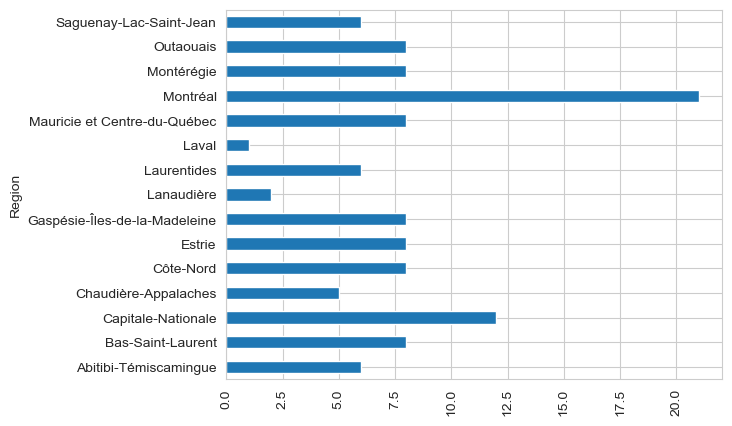

In [78]:
df.groupby(['Region']).count()['No_permis_installation'].plot(kind='barh')
plt.xticks(rotation=90)
plt.show()

### Exploration avec le ProfileReport

Cette librairie nous aide à sauver du temps en générant des graphiques standards et des statistiques pour notre jeu de données.
 
Des logiciels comme <a href="https://openrefine.org">OpenRefine</a> et <a href="https://orangedatamining.com">Orange</a> peuvent aussi nous aider à faire l'exploration des données.
    
    


In [80]:
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Les données de rendement de la production d'avoine par région en Ontario 




<img style='float:right;' width='250px' src='https://ontariograinfarmer.ca/wp-content/uploads/2017/09/gluten-free-oats-1024x576.jpg'>


Des données présentant les rendements de production d'avoine pour différentes régions de l'Ontario sont disponibles sur le site ontarien:


<a href="https://data.ontario.ca/dataset/ontario-field-crop-area-and-production-estimates-by-county">
https://data.ontario.ca/dataset/ontario-field-crop-area-and-production-estimates-by-county
</a>

Voici de quoi a l'air le fichier
<br>

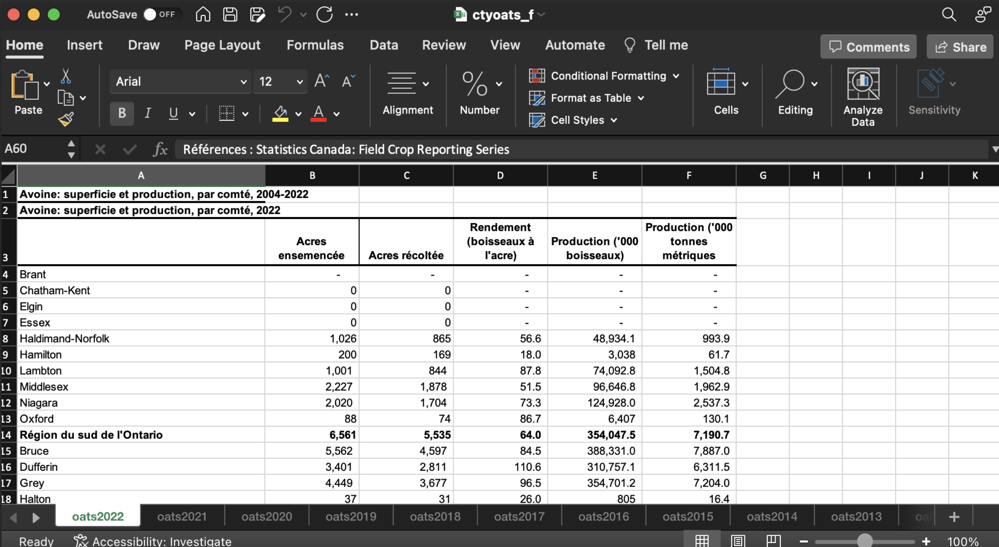

Informations sur le jeu de données : 

* Les données disponibles ont été collectées pour la période de 2004 à 2022.  
* Les données sont accessibles sous la forme d'un fichier Excel.  
* Le fichier Excel contient plusieurs onglets, un par année. 
* Ce sont des données numériques et chronologiques.


Comme première étape, il faut s'assurer de comprendre le domaine et les variables.

### Qu'est-ce que le rendement ?


Le rendement est défini comme suit:   $ Rendement = \frac {Production}{Acres_{récoltées}} *1000$

où le $Rendement$ est en boisseaux à l'acre.


C'est donc le nombre de boisseaux produits par acre récoltée.  Ici, on ne s'intéresse pas aux nombres d'acres ensemencées.  On ne cherche pas à caractériser le ratio récoltée/ensemencée.



## Chargement des données de rendement d'avoine

Nous chargeons ensuite en mémoire les données provenant du fichier Excel décrit plus haut. La librairie `pandas`nous permet de lire directement un fichier Excel.  

La fonction `pd.read_excel()` lit un onglet à la fois.  Nous utilisons plutôt `pd.ExcelFile()` pour gérer nous-mêmes les onglets (`sheet_names`). 

In [81]:
! ls ../data/raw

Kaggle_Crop_recommendation.csv dataset_v1.csv
ctyoats_f.xlsx                 portrait_horaire_urgence.csv


In [84]:
# Nous allons chercher le fichier directement via l'URL
#url = "https://data.ontario.ca/dataset/e30dc044-5f75-4f33-b63e-6326f8769bea/resource/5fe1b9cc-5c3b-4f8f-99fc-2cacf41fcf9d/download/ctyoats_f.xlsx"
#f = pd.ExcelFile(url)
file = '../data/raw/ctyoats_f.xlsx'
f = pd.ExcelFile(file)
sheet_names = f.sheet_names

# Nous imprimons les noms des onglets du fichier Excel pour se familiariser avec les données
print(f'{len(sheet_names)} onglets dans le fichier: {os.path.basename(file)}')
print('--------------------')
print(", ".join(sheet_names))

19 onglets dans le fichier: ctyoats_f.xlsx
--------------------
oats2022, oats2021, oats2020, oats2019, oats2018, oats2017, oats2016, oats2015, oats2014, oats2013, oats2012, oats2011, oats201, oats2009, oats2008, oats2007, oats2006, oats2005, ots2004


Le fichier contient 19 onglets.

Ce n'est pas pratique d'avoir les données dans 19 structures de données séparées (onglets). 
Concaténons les données des différents onglets.  

Nous ferons ceci en deux étapes dans ce notebook pour pouvoir les regarder individuellement.  
Nous pourrions le faire en une seule étape (dans un script par exemple): 

1. Nous allons itérer parmi tous les onglets et conserver les `dataframe` de `pandas` dans un dictionnaire. 
2. Nous allons concaténer les différents `dataframe` en un seul.


In [86]:
# Lecture de tous les onglets du fichier Excel.  
# Nous les conservons dans un dictionnaire de dataframes pandas pour l'instant.
dfs = {}
for sheet in sheet_names:  
    df = f.parse(sheet, skiprows=1)
    df.loc[:, 'Onglet'] = sheet 
    dfs[sheet] = df
    print(F'{sheet} : {df.shape[0]} rangées, {df.shape[1]} colonnes,  {list(df.columns)}')

oats2022 : 58 rangées, 7 colonnes,  ['Avoine: superficie et production, par comté, 2022', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Onglet']
oats2021 : 58 rangées, 7 colonnes,  ['Avoine: superficie et production, par comté, 2021', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Onglet']
oats2020 : 58 rangées, 7 colonnes,  ['Avoine: superficie et production, par comté, 2020', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Onglet']
oats2019 : 57 rangées, 7 colonnes,  ['Avoine: superficie et production, par comté, 2019', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Onglet']
oats2018 : 57 rangées, 7 colonnes,  ['Avoine: superficie et production, par comté, 2018', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5', 'Onglet']
oats2017 : 57 rangées, 7 colonnes,  ['Unnamed: 0', 'Acres ensemencée', 'Acres récoltée', "Rendement  (boisseaux à l'acre)", "Production ('000 boisseau

### À votre tour 


C'est une bonne pratique de regarder les données souvent : les premières rangées comme les dernières.
Inspecter différents onglets, le début et la fin.  Noter vos observations.



In [88]:
# Inspection de quelques onglets dans le fichier
i = 1
dfs[sheet_names[i]].head(5)

,"Avoine: superficie et production, par comté, 2021",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Onglet
0,NaN,Acres ensemencée,Acres récoltée,Rendement (boisseaux à l'acre),Production ('000 boisseaux),Production ('000 tonnes métriques,oats2021
1,Brant,184.056039,95.821107,124.171791,11.898278,0.241654,oats2021
2,Chatham-Kent,0,0,0,0,0,oats2021
3,Elgin,180.988438,94.224088,166.327154,15.672024,0.318299,oats2021
4,Essex,76.690016,39.925461,100.762251,4.022979,0.081707,oats2021


### Observations    
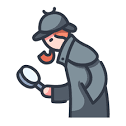


<ul >
<li>L'année peut être récupérée dans les noms d'onglet.</li>

<li>Chaque onglet contient les données d'une année donnée.</li>

<li>Les onglets ne comportent pas tous le même nombre de rangées et deux onglets contiennent des erreurs dans leur nom.</li>

<li>Tous les onglets ont le même nombre de colonnes.</li>

<li>Le header n'est pas toujours dans la première rangée, il est parfois dans la seconde.</li>
<li>La colonne contenant les régions n'est pas nommée.</li>

</ul>



<ul >
<li>Incohérence de langue (FR/EN) (oats).</li>

<li>Incohérence dans le nombre de lignes entre les onglets.</li>

<li>Incohérence dans le nom des régions entre les onglets.</li>

<li>Incohérence dans le nom des colonnes entre les onglets.</li>

<li>Incohérence pour indiquer l'absence de données ou l'absence d'ensemencement (on ne sait pas ce que signifie '-', 'x', 0). </li>
    
<li>Logiquement, un rendement de 0 semble improbable si les valeurs d'acres ensemencées et d'acres récoltées ne sont pas 0. Il faudrait approfondir ceci.</li>

<li>Incohérence dans les valeurs dernières lignes des onglets</li>

<li>Le nom des colonnes a changé au fil du temps.  Au moins, la signification et l'ordre sont restés les mêmes.</li>
</ul>

## Plan de nettoyage

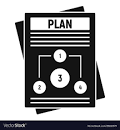

<br>

La première étape est de gérer les erreurs évidentes pour produire un jeu de données que nous pourrons explorer plus en détails. Pour l'instant, nous ne pouvons procéder à l'EDA avec le jeu de données que nous avons. 
Encore moins intégrer un autre type de données, comme les données météo.
Le processus de nettoyage est un processus itératif.  Nous ne pouvons normalement pas tout corriger du premier coup.


Quelles sont les étapes ? <br>
    
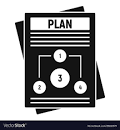


1. Gérer la différence entre le nombre de rangées pour pouvoir concaténer les onglets en une seule structure de données.<br>
<em>
    <ul>
    <li>Nous savons que la dernière ligne de données contient le total pour l'Ontario</li>
    <li>Nous savons que les mots 'Rendement' et 'Production' se trouvent dans la rangée contenant les noms de colonnes (header)</li>
    </ul>
</em><br><br>


2. Standardiser le vocabulaire
<em>
    <ul>
    <li>Nous ne voulons pas garder les mots clés 'Division', 'County',... dans le nom des régions</li>
    
    <li>Nous voulons harmoniser les noms de colonnes</li>
    
    <li>Nous voulons standardiser les valeurs nulles</li>
        </ul>
</em>





    
3.  Extraire les années des noms d'onglets et les ajouter aux données<br>
<em>
     <ul>
   <li>Malgré les erreurs dans le nom des onglets, ce qui nous intéresse est l'année que nous voulons conserver</li>
     </ul>
</em><br>


4. Nous voulons combiner les données des différents onglets en une seule matrice.  Ce n'est pas très pratique de travailler avec 19 matrices de données.  


### Concaténation des dataframes

In [90]:
new_cols = ['Region', 'Acres ensemencée', 'Acres récoltée', "Rendement (boisseaux à l'acre)",
            "Production ('000 boisseaux)", "Production ('000 tonnes métriques)",  "Onglet", "Annee"]

data = pd.DataFrame()
for sheet, df in dfs.items():  
    df['Onglet'] = sheet
    word_in_column = df.columns.str.contains("Production", regex=True).any() # mot-clé pour trouver le header
    if word_in_column == False:
        header = df.iloc[0,:].values # le header se trouve dans la première rangée
        df = df.iloc[1:,:] # les données commencent à la seconde rangée
        df.columns = header
      
    year = int(re.search(r'\d+', sheet).group())
    df['Annee'] = 2010 if year == 201 else year
    
    df.columns = new_cols
    
    last_row_index = df.Region.tolist().index('Ontario')
    df = df.iloc[:last_row_index, :]
    data = pd.concat([data, df], axis=0, ignore_index=True)

/var/folders/4z/qfddy2451_9bdz9q7pb2cggm0000gn/T/ipykernel_35006/1374577262.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Annee'] = 2010 if year == 201 else year
/var/folders/4z/qfddy2451_9bdz9q7pb2cggm0000gn/T/ipykernel_35006/1374577262.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Annee'] = 2010 if year == 201 else year
/var/folders/4z/qfddy2451_9bdz9q7pb2cggm0000gn/T/ipykernel_35006/1374577262.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [92]:
data = data.loc[~data.Region.str.contains('Ontario'),:]
data = data.loc[~data.Region.str.contains('Région'),:]
data = data.convert_dtypes()
data = data.replace('-', 0)
data = data.replace('x', 0)
data[data.isnull()] = 0

# Optionnel. Nous pouvons renommer les colonnes pour les rendre plus lisibles avec rename
# Nous aurions pu faire cela dans la boucle plus haut en utilisant ces noms dans new_cols
new_column_names = { "Acres ensemencée": "Ensemencee",
                     "Acres récoltée": "Recoltee",
                     "Rendement (boisseaux à l'acre)": "Rendement",
                     "Production ('000 boisseaux)": "Production_boisseaux",
                     "Production ('000 tonnes métriques)": "Production_tonnes",
                     "Year": "Annee",
                     "Sheet": "Onglet"}

data.rename(columns=new_column_names, inplace=True)

/var/folders/4z/qfddy2451_9bdz9q7pb2cggm0000gn/T/ipykernel_35006/1724618060.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace('-', 0)
/var/folders/4z/qfddy2451_9bdz9q7pb2cggm0000gn/T/ipykernel_35006/1724618060.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace('x', 0)


Regardons de quoi a l'air la nouvelle matrice de données.  
Est-ce que les dimensions semblent bien?

In [94]:
print('Dimension du dataframe: ', data.shape)
data.head(5)

Dimension du dataframe:  (912, 8)


,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
0,Brant,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
1,Chatham-Kent,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
2,Elgin,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
3,Essex,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
4,Haldimand-Norfolk,1025.801292,865.261503,56.554159,48.934137,0.993852,oats2022,2022


In [96]:
data.tail(2)

,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
1004,Thunder Bay District,700.0,400.0,76.200551,30.48,0.470066,ots2004,2004
1005,Timiskaming District,8200.0,6100.0,70.550921,430.36,6.637056,ots2004,2004


 ### Uniformisation des noms de régions 
 
Nous avons des noms de régions non uniformes entre les onglets.  Les onglets plus anciens incluent le type de division administrative (County, District, Division, ...)

In [98]:
data.loc[data.Region.str.contains('Brant'),:].tail(5)

,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
742,Brant,1500.0,1400.0,73.000000,102.20,1.576139,oats2008,2008
795,Brant,1300.0,1200.0,40.000000,48.00,0.740261,oats2007,2007
848,Brant,1468.0,1200.0,73.000000,87.60,1.350976,oats2006,2006
901,Brant County,2100.0,2100.0,43.778475,91.93,1.417754,oats2005,2005
954,Brant County,2200.0,1800.0,64.692171,116.45,1.795904,ots2004,2004


#### Comment uniformiser les noms des régions ?

<br>


  <ul> 
      <li>Retirer les totaux par régions ("Région du Nord de l'Ontario")</li>
   <li>Remplacer les mots : County, Regional Municipality, District, Counties, Division, District Municipality, United Counties</li>
   <li> Que faire avec le Grand ? (Grand Sudbury &rarr; est la ville, Sudbury est le district)</li>
      </ul>


In [100]:
# Le code recherche les mots communs à plusieurs régions dans une liste de noms de régions. 
# Il stocke ces mots dans la liste "words" afin de les utiliser plus tard pour nettoyer les noms de région.

regions = data.Region.unique()
words = []
for region in regions:
    found = [r for r in regions if region in r]
    if len(found) > 1:
        print(region, found)
        words += [r.replace(region, '') for r in found if r!=region]
words = list(set(words))

Brant ['Brant', 'Brant County']
Chatham-Kent ['Chatham-Kent', 'Chatham-Kent Division']
Elgin ['Elgin', 'Elgin County']
Essex ['Essex', 'Essex County']
Haldimand-Norfolk ['Haldimand-Norfolk', 'Haldimand-Norfolk Regional Municipality']
Hamilton ['Hamilton', 'Hamilton Division']
Lambton ['Lambton', 'Lambton County']
Middlesex ['Middlesex', 'Middlesex County']
Niagara ['Niagara', 'Niagara Regional Municipality']
Oxford ['Oxford', 'Oxford County']
Bruce ['Bruce', 'Bruce County']
Dufferin ['Dufferin', 'Dufferin County']
Grey ['Grey', 'Grey County']
Halton ['Halton', 'Halton Regional Municipality']
Huron ['Huron', 'Huron County']
Peel ['Peel', 'Peel Regional Municipality']
Perth ['Perth', 'Perth County']
Simcoe ['Simcoe', 'Simcoe County']
Waterloo ['Waterloo', 'Waterloo Regional Municipality']
Wellington ['Wellington', 'Wellington County']
Durham ['Durham', 'Durham Regional Municipality']
Haliburton ['Haliburton', 'Haliburton County']
Hastings ['Hastings', 'Hastings County']
Kawartha Lakes ['

In [102]:
# Le code modifie les noms de région.
# Il utilise la liste de mots extraits précédemment pour supprimer ces mots des noms de région

words.remove('Grand ')
words = sorted(list(set(words)))
words.append(' Municipality')

def clean_region(region):
    for word in words:
        region = region.replace(word, '')
    return region

data.loc[data.Region == 'Sudbury Regional Municipality', 'Region'] = 'Grand Sudbury'
data.loc[:, 'Region'] = data.Region.apply(lambda x: clean_region(x))

## Exploration des données

    
Maintenant que nous avons une matrice de données manipulable, nous allons explorer les données pour mieux les comprendre et corriger les erreurs restantes.

Comment ? En générant des graphiques et des statistiques
    


In [104]:
# Inspection des statistiques des variables 

data[0:-2].describe()

,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Annee
count,910.000000,910.000000,910.000000,910.000000,910.000000,910.0
mean,1765.904212,1480.643100,53.512213,107.909837,1.741702,2013.01978
std,2447.793641,2176.332049,33.275694,188.010432,3.192107,5.469954
min,0.000000,0.000000,0.000000,0.000000,0.000000,2004.0
25%,250.385813,184.552169,37.000000,7.827500,0.138799,2008.0
50%,1000.000000,800.000000,61.000000,43.923712,0.712116,2013.0
75%,2306.643507,1930.000000,75.220530,127.645000,2.018638,2018.0
max,22473.357022,21430.355924,166.327154,2289.369951,46.497104,2022.0


### Visualisation


La meilleure façon de comprendre un jeu de données est en l'explorant à l'aide de graphique.  Il est important d'identifier quelles informations et quels graphiques sont pertinents.  La visualisation doit avoir une intention.


#### Heatmap

Ce graphique met en relation deux variables qualitatives (catégories) (ici, l'année et la région) et une variable continue (ici, le rendement).

In [106]:
data.head()

,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
0,Brant,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
1,Chatham-Kent,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
2,Elgin,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
3,Essex,0.000000,0.000000,0.000000,0.000000,0.000000,oats2022,2022
4,Haldimand-Norfolk,1025.801292,865.261503,56.554159,48.934137,0.993852,oats2022,2022


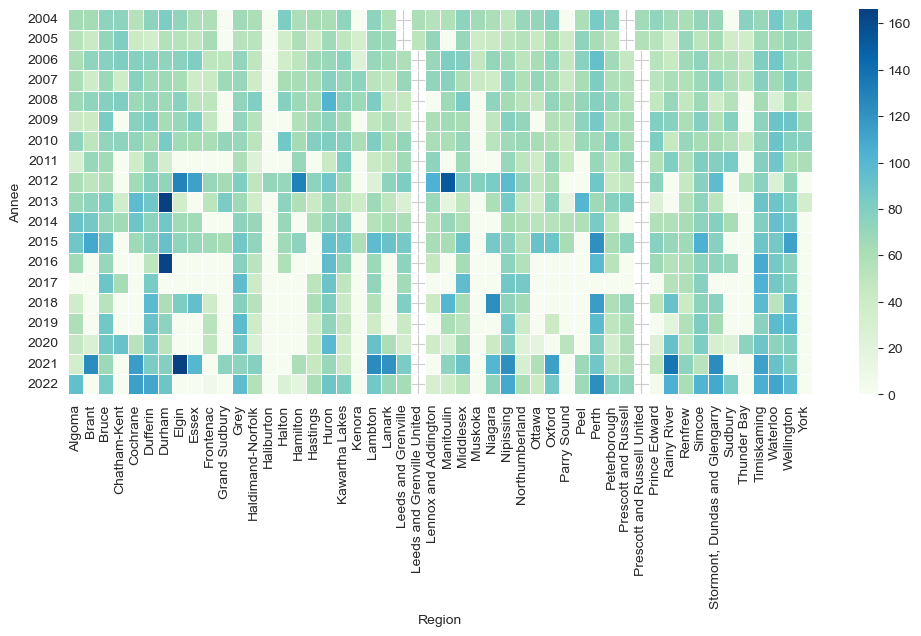

In [108]:
mx = data.pivot_table(index="Annee", columns="Region", values="Rendement")
nan_mask = mx.isna()
mx = mx.replace(np.nan, 0)
mx = mx.astype(int)

fig = plt.figure(figsize=(12, 5))
sns.heatmap(mx, linewidths=.5, cmap='GnBu', mask=nan_mask)
plt.show()

Nous pouvons voir que certaines régions ont un rendement de 0 et que certaines régions ont des valeurs manquantes.  

Le rendement semble plus élevé dans les années plus récentes mais il y a beaucoup de valeurs à 0.

Nous pouvons revisiter le heatmap et inclure la valeur de rendement comme annotation.

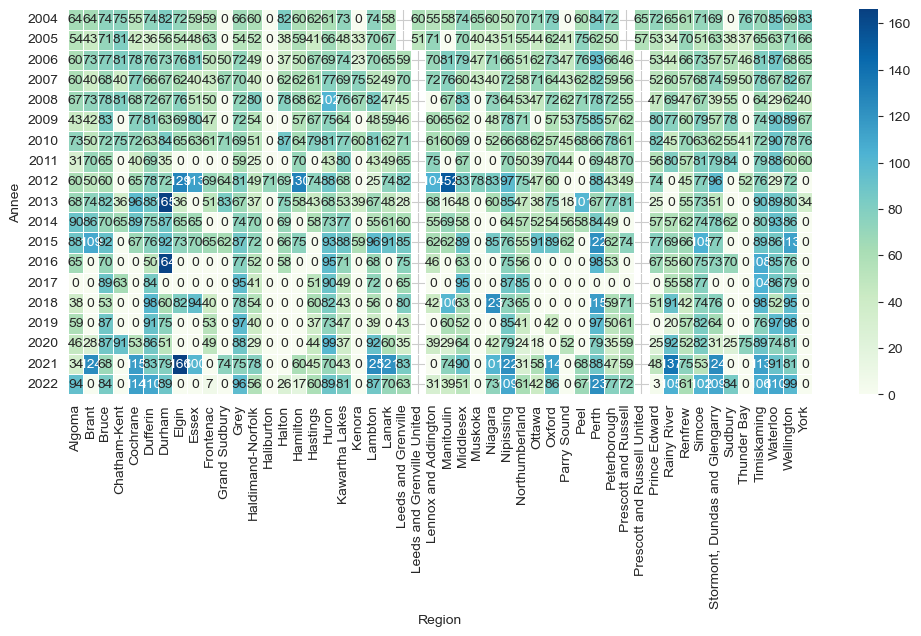

In [110]:
mx = data.pivot_table(index="Annee", columns="Region", values="Rendement")
nan_mask = mx.isna()
mx = mx.replace(np.nan, 0)
mx = mx.astype(int)

fig = plt.figure(figsize=(12, 5))
sns.heatmap(mx, annot=True, fmt=".0f", cmap='GnBu', linewidths=.5, mask=nan_mask)
plt.show()

#### Clustermap

Comme le heatmap, le graphique met en relation deux variables catégoriques et une variable continue.

En plus, il présente un clustering hiérarchique des années et des régions basé sur le rendement.  Les années ayant des profils de rendement similaires parmi les régions sont positionnés plus près et les régions ayant des profils de rendement similaires parmi les années sont positionnés plus près.



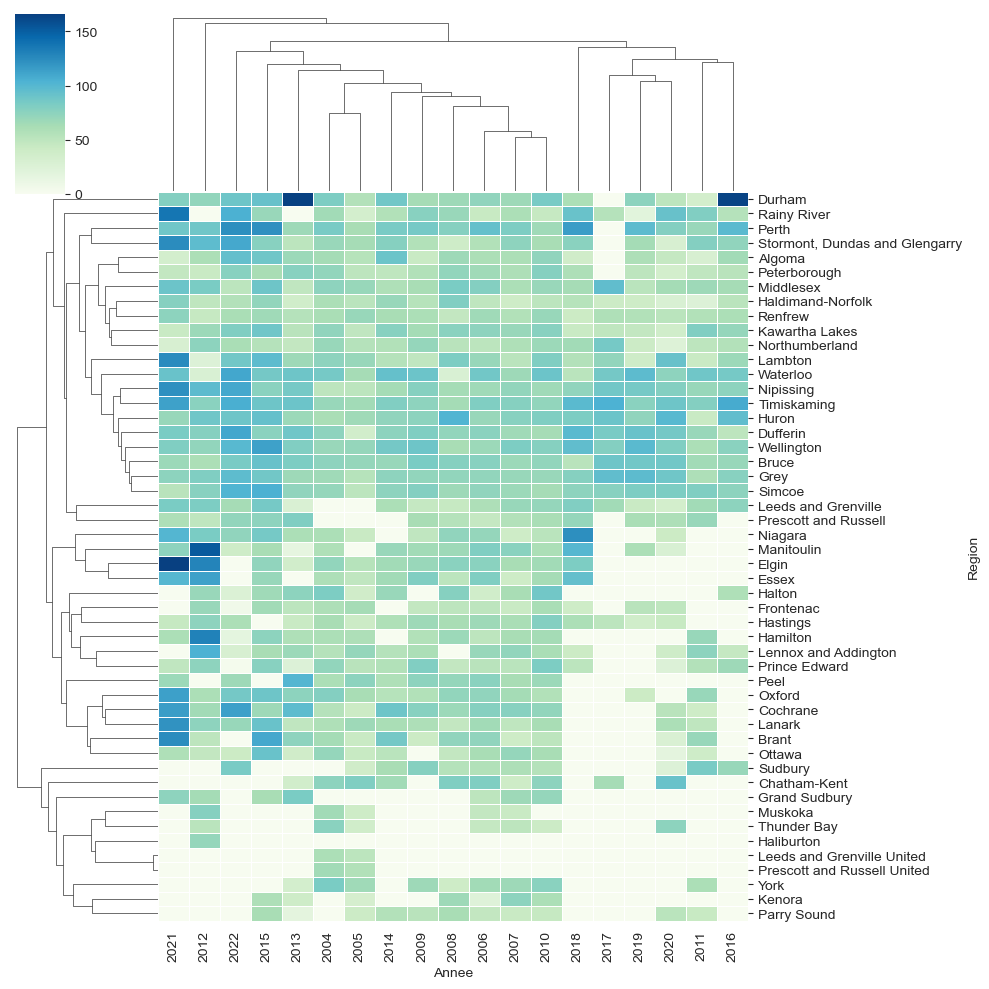

In [112]:
mx = data.pivot_table(index="Annee", columns="Region", values="Rendement").fillna(0).astype(int)
sns.clustermap(mx.T, cmap="GnBu",  linewidths=.5, yticklabels=True)
plt.show()    


Nous observons trois groupes principaux pour les régions, dominés par la présence de valeurs nulles.  Pour les années, il y a 2 groupes, dominés par le même critère.  

 <br>
Il y a donc 11 régions pour lesquelles les valeurs sont manquantes pour la plupart des années (Muskoca, ThunderBay, ...).  Et de 2016 à 2022, il manque plus de données.

Il y a quelques régions qui ont un rendement supérieur à 150.


#### Pairplot

Ce graphique met en relation deux variables.  Il permet de voir qualitativement si des variables sont corrélées en entre elles en plus de présenter la distribution de chaque variable.  Nous pouvons voir que :



<Figure size 1000x400 with 0 Axes>

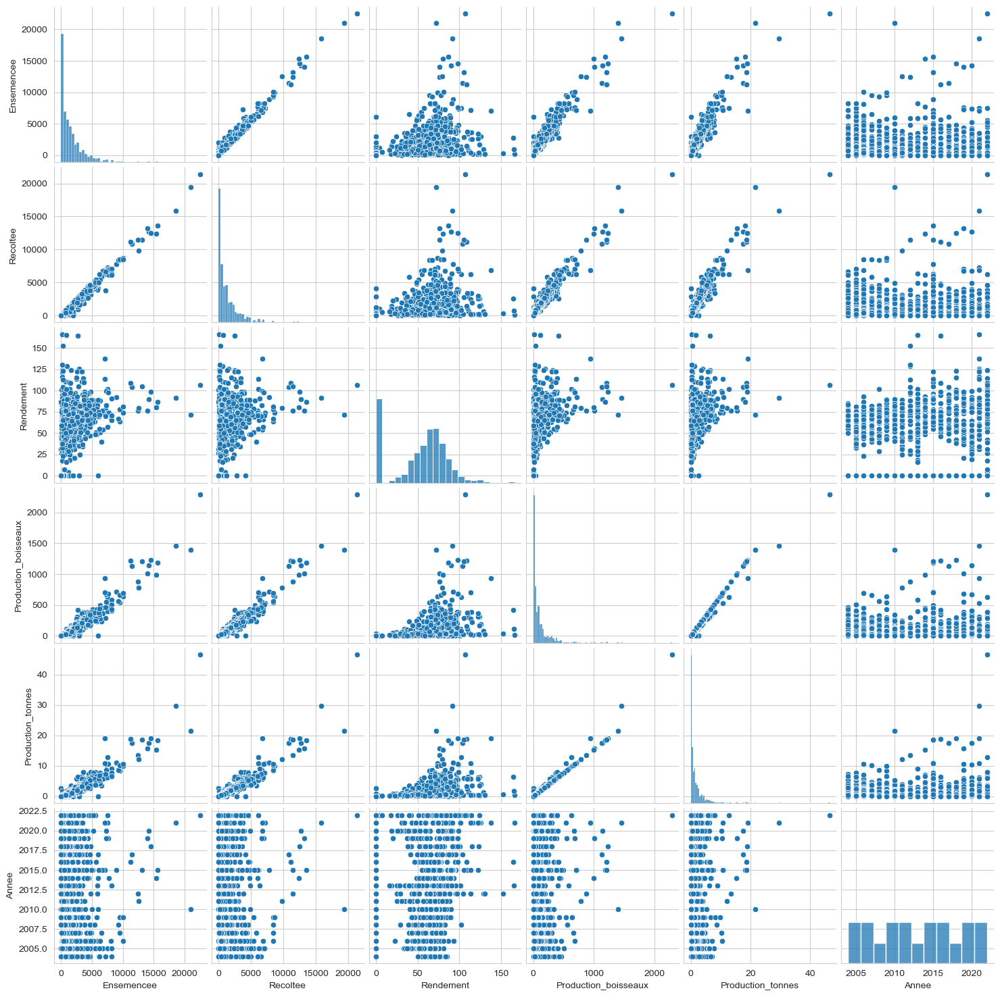

In [114]:
fig = plt.figure(figsize=(10, 4))
sns.pairplot(data)
plt.show()

* la distribution du rendement est bimodale.  
    * il suit une distribution normale 
    * il y une grande proportion de valeurs égales à 0

* le nombre d'acres récoltées est corrélé au nombre d'acres ensemencées.
* la production de boisseaux est proportionnelle au nombre d'acres ensemencées
* le rendement n'est pas corrélé avec les autres variables
* il y a un grand nombre d'entrées à 0

#### Graphes de distribution

L'exploration des différentes variables peut soulever des questions au niveau de la logique.  
Ici, est-ce que c'est normal d'avoir des cas où l'on récolte plus que l'on ensemence? 

L'histogramme du pourcentage d'acres récoltées versus ensemencées montre qu'il y a des cas à investiguer.

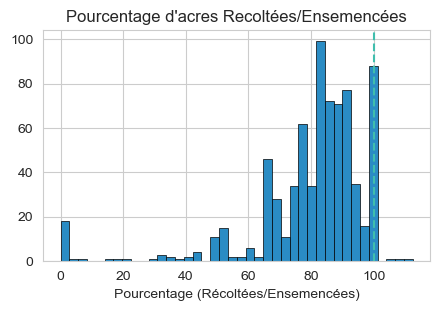

In [115]:
fig = plt.figure(figsize=(5, 3))
plt.hist(data["Recoltee"]/data["Ensemencee"]*100, bins=40, color='#2A8CC4'
         , edgecolor='black', linewidth=0.5)

plt.axvline(x=100, c='#40BEAD', linestyle='--')
plt.title("Pourcentage d'acres Recoltées/Ensemencées")
plt.xlabel("Pourcentage (Récoltées/Ensemencées)")
plt.show()

In [118]:
data.loc[(data["Recoltee"] == 0) & (data["Ensemencee"] > 0), :].head()

,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
356,Prescott and Russell,400.0,0.0,0.0,0.0,0.0,oats2016,2016
364,Manitoulin,660.0,0.0,0.0,0.0,0.0,oats2016,2016
584,Chatham-Kent,296.0,0.0,0.0,0.0,0.0,oats2011,2011
585,Elgin,450.0,0.0,0.0,0.0,0.0,oats2011,2011
586,Essex,165.0,0.0,0.0,0.0,0.0,oats2011,2011


In [120]:
data.loc[data["Recoltee"] > data["Ensemencee"], :]

,Region,Ensemencee,Recoltee,Rendement,Production_boisseaux,Production_tonnes,Onglet,Annee
106,Brant,200.0,225.0,28.800000,6.48,0.099935,oats2020,2020
207,Rainy River,2190.0,2200.0,20.768182,45.69,0.704636,oats2019,2019
332,Halton,690.0,720.0,58.305556,41.98,0.647420,oats2016,2016
358,"Stormont, Dundas and Glengarry",1030.0,1110.0,73.126126,81.17,1.251812,oats2016,2016


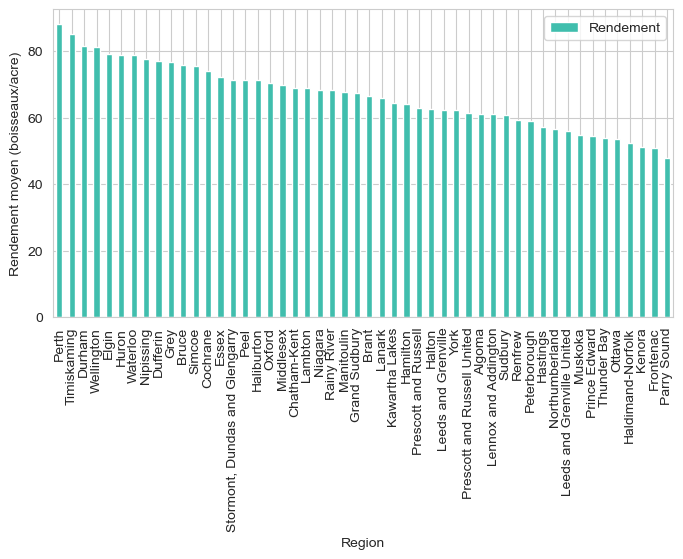

In [122]:
# Rendement moyen par region
fig, ax = plt.subplots(figsize=(8, 4))
data.loc[data.Rendement > 0, :].groupby("Region")\
    .agg({"Rendement": "mean"}) \
    .sort_values(by="Rendement", ascending=False) \
    .plot(kind='bar', ax=ax, color=colors[0])
plt.ylabel('Rendement moyen (boisseaux/acre)')
plt.show()

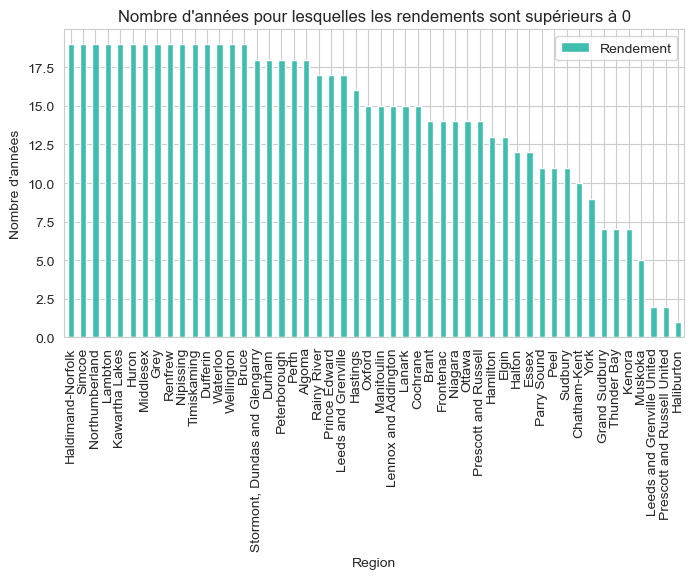

In [124]:
# Nombre d'années pour lesquelles les rendements sont supérieurs à 0
fig, ax = plt.subplots(figsize=(8, 4))
data.loc[data.Rendement > 0, :].groupby("Region") \
            .agg({"Rendement": "count"}) \
            .sort_values(by="Rendement", ascending=False) \
            .plot(kind='bar', ax=ax, color=colors[0])
plt.ylabel("Nombre d'années")
plt.title("Nombre d'années pour lesquelles les rendements sont supérieurs à 0")
plt.show()

#### Boxplot 

Le boxplot nous permet de facilement mettre en relation des distributions.  Nous pouvons donc avoir un aperçu du rendement par région et par année.
Le boxplot présente la valeur médiane et les valeurs quantiles ansi que les valeurs aberrantes de la distribution.

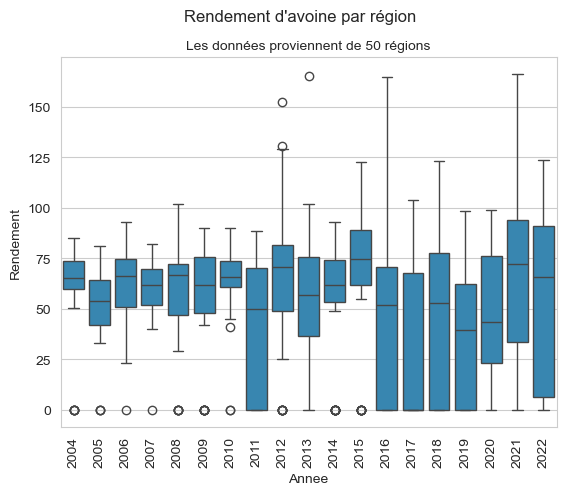

In [126]:
sns.boxplot(data, y='Rendement', x='Annee', color=colors[1])
plt.xticks(rotation=90)
plt.suptitle("Rendement d'avoine par région")
plt.title(f"Les données proviennent de {len(data.Region.unique())} régions", fontsize=10)
plt.show()

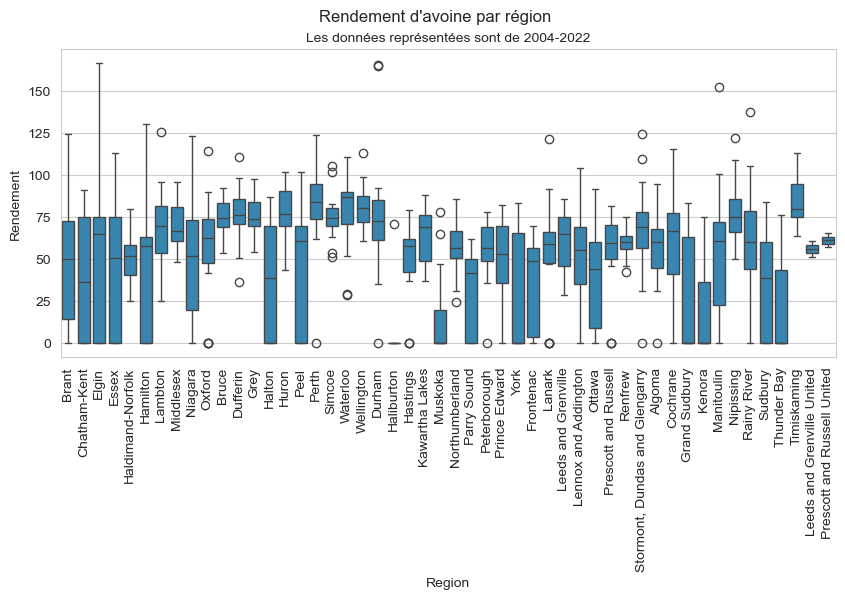

In [128]:
fig = plt.figure(figsize=(10, 4))
sns.boxplot(data,  y='Rendement', x='Region', color=colors[1])
plt.xticks(rotation=90)
plt.suptitle("Rendement d'avoine par région")
plt.title("Les données représentées sont de 2004-2022", fontsize=10)
plt.show()

Compte tenu des valeurs manquantes, les boxplots ne nous renseignent que partiellement sur les différences de distributions entre les années et les régions.

#### Graphiques spécifiques

Nous construirons des graphiques particuliers pour répondre à des questions spécifiques.

Par exemple, ici on veut suivre le rendement au fil des ans dans trois régions bien précises.

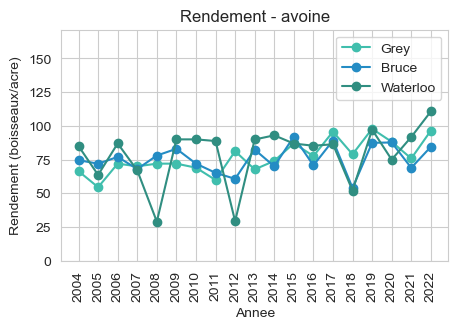

In [130]:
fig, ax = plt.subplots(figsize=(5,3))

regions = ['Grey', 'Bruce', 'Waterloo']
for i,region in enumerate(regions):
    data.loc[data.Region==region,:].plot(x='Annee', y='Rendement', label=region, marker='o', ax=ax, color=colors[i])

plt.xticks(data.Annee.unique(), rotation=90)
plt.ylabel('Rendement (boisseaux/acre)')
plt.title(f'Rendement - avoine')
plt.ylim(0,data.Rendement.max()+5)
plt.show()

In [132]:
def plot_subset(data, x, y, values, values_col, y_units='', x_units='', capture_plot=False):            
    '''
    Graphique de y en fonction x pour les valeurs spécifiées
    Exemple : 
    plot_subset(data, x='Annee', y='Rendement', values=['Sudbury', 'Grand Sudbury'],
                values_col='Region', y_units='boisseaux/acre')
    '''
    _, ax = plt.subplots(figsize=(5,3))
      
    for value in values :
        tmp = data.loc[data[values_col]==value, :]
        tmp.plot(x=x, y=y, label=value, marker='o', ax=ax)
        
    plt.xticks(data[x].unique(), rotation=90)
    plt.ylim(data[y].min()-5, data[y].max()+5)
    plt.ylabel(f'{y.title()} ({y_units})')
    plt.xlabel(f'{x.title()} ({x_units})')
    plt.title(f'{y.title()} par {values_col.lower()} en fonction de {x.lower()}')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
   
    plt.show()


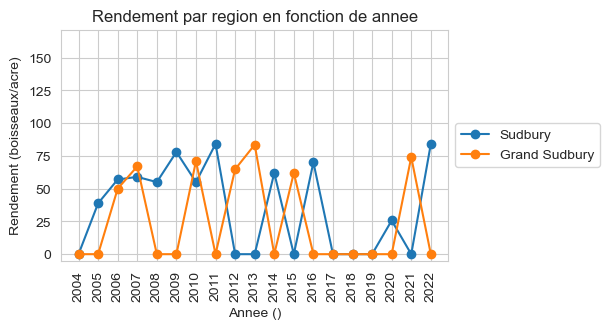

In [83]:
plot_subset(data, x='Annee', y='Rendement', values=['Sudbury', 'Grand Sudbury'],
                values_col='Region', y_units='boisseaux/acre')

### Exploration avec le ProfileReport


Cette librairie nous aide à sauver du temps en générant des graphiques standards et des statistiques pour notre jeu de données.
   
Des logiciels comme <a href="https://openrefine.org">OpenRefine</a> et <a href="https://orangedatamining.com">Orange</a> peuvent aussi nous aider à faire l'exploration des données.

In [134]:
# Compter environ 20-30 secondes
report = ProfileReport(data, title="Profiling Report")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Sauvegarde du fichier de données nettoyées

Le processus de nettoyage est un processus itératif.  Nous pouvons sauvegarder une première version des données en sachant que nous y reviendrons au besoin si des problèmes de qualité sont identifiés en aval. 

In [136]:
data.to_csv('rendement_avoine_v1.csv')

## À votre tour


* Quelle autre visualisation pourriez-vous faire pour mieux comprendre les données ? 
* Quelles questions supplémentaires pourraient être posées ?
* Qu'avons-nous oublié de considérer ?


Ce n'est pas tout de créeer des graphiques, il faut aussi les interpréter.  
Pouvez-vous produire un graphique et en tirer une conclusion ou une observation sur les données.
